In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
# Models 
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn import linear_model

# Neuronal Network
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense

# standardization
from sklearn.preprocessing import StandardScaler

# folds
from sklearn.model_selection import TimeSeriesSplit

# Evaluation metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

# statistical calculations
from scipy import stats
import statsmodels.api as sm

# visualization
import plotly.express as px
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings("ignore")
random_state = 1601

In [2]:
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.metrics import make_scorer
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from xgboost.sklearn import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from functools import partial

In [3]:
from lightgbm import plot_importance

In [4]:
'''Customize visualization
Seaborn and matplotlib visualization.'''
import matplotlib.pyplot as plt
import seaborn as sns
#plt.style.use('bmh')                    
sns.set_style({'axes.grid':False}) 

# Cargar datos 

In [5]:
current_path =  os.getcwd()
train_file_path =  './generated_data/train.csv'
test_file_path = './generated_data/test.csv'

train_path = os.path.join(current_path, train_file_path)
test_pah = os.path.join(current_path, test_file_path)

print(f'The path file for the train dataset is: {train_path}')
print(f'The path file for the test dataset is: {test_pah}')

The path file for the train dataset is: C:\Users\Admin\Desktop\finally-datascience\./generated_data/train.csv
The path file for the test dataset is: C:\Users\Admin\Desktop\finally-datascience\./generated_data/test.csv


In [6]:
train = pd.read_csv(train_path).reset_index(drop=True)
test = pd.read_csv(test_pah) 

In [7]:
# obtenemos columnas del conjunto de entrenamiento 
for idx, column in enumerate(train.columns):
    print(f'{idx} {column}')

0 fecha
1 total_calls
2 mean_total_calls_historical_last_3_days
3 max_total_calls_historical_last_3_days
4 stddev_total_calls_historical_last_3_days
5 var_total_calls_historical_last_3_days
6 min_total_calls_historical_last_3_days
7 mean_total_calls_duration_last_3_days
8 max_total_calls_duration_last_3_days
9 stddev_total_calls_duration_last_3_days
10 var_total_calls_duration_last_3_days
11 min_total_calls_duration_last_3_days
12 mean_missing_calls_last_3_days
13 max_missing_calls_last_3_days
14 stddev_missing_calls_last_3_days
15 var_missing_calls_last_3_days
16 min_missing_calls_last_3_days
17 mean_available_time_last_3_days
18 max_available_time_last_3_days
19 stddev_available_time_last_3_days
20 var_available_time_last_3_days
21 min_available_time_last_3_days
22 mean_away_time_last_3_days
23 max_away_time_last_3_days
24 stddev_away_time_last_3_days
25 var_away_time_last_3_days
26 min_away_time_last_3_days
27 mean_busy_time_last_3_days
28 max_busy_time_last_3_days
29 stddev_busy_ti

In [8]:
# separamos la data
y_train = train['total_calls']
x_train = train.drop('total_calls', axis=1)

In [63]:
from dateutil.relativedelta import relativedelta
from sklearn.base import BaseEstimator, TransformerMixin

class AggDayofWeek(BaseEstimator, TransformerMixin):
    
    def __init__(self: object, fecha_column: str):
        self.fecha_column = fecha_column
    def fit(self, X, y=None):
        return self
        
    def transform(self, X: pd.DataFrame, y=None) -> None:

        X['dayofweek'] = (X[self.fecha_column].apply(lambda x: pd.to_datetime(x) + relativedelta(months=1)).dt.dayofweek)
        return X
    
class AggMonth(BaseEstimator, TransformerMixin):
    
    def __init__(self: object, fecha_column: str):
        self.fecha_column = fecha_column
    
    def fit(self, X, y=None):
        return self
        
    def transform(self, X: pd.DataFrame, y=None) -> None:
        X['month'] = (X[self.fecha_column].apply(lambda x: pd.to_datetime(x) + relativedelta(months=1)).dt.month)
        return X
    
class AggQuarter(BaseEstimator, TransformerMixin):
    
    def __init__(self: object, fecha_column: str):
        self.fecha_column = fecha_column
    
    def fit(self, X, y=None):
        return self
        
    def transform(self, X: pd.DataFrame, y=None) -> None:
        X['quarter'] = (X[self.fecha_column].apply(lambda x: pd.to_datetime(x) + relativedelta(months=1)).dt.quarter)
        return X
    
class FeatureSelector(BaseEstimator, TransformerMixin):
    def __init__(self, features_to_select):
        self.features_to_select = features_to_select

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Filtrar las columnas de X basadas en la lista de características importantes
        selected_features = [col for col in self.features_to_select if col in X.columns]
        return X[selected_features]

In [10]:
from sklearn.pipeline import Pipeline
from feature_engine.selection import DropFeatures
from feature_engine.encoding import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from feature_engine.wrappers import SklearnTransformerWrapper

to_drop = ['fecha']
drop_features = DropFeatures(features_to_drop = to_drop)

agg_DayofWeek = AggDayofWeek(fecha_column = 'fecha')
agg_Month = AggMonth(fecha_column = 'fecha')
agg_Quarter = AggQuarter(fecha_column = 'fecha')

data_pipeliene = Pipeline(
    [ 
        ('agg_DayofWeek', agg_DayofWeek),
        ('agg_Month', agg_Month),
        ('agg_Quarter', agg_Quarter),
        ('drop_features', drop_features),
    ]
)


In [11]:
def train_get_score_cv(
    x_train: pd.DataFrame, 
    y_train: pd.Series, 
    models, 
    pipeline_engine: Pipeline, 
    features_selected: list=None,                   
    k: int=5, 
    random_state: int=199
    ) -> pd.DataFrame:
    """
    Obtniene el MAPE como métrica usando cross validation kfold. El cross validation sirve para simular como 
    el modelo reacciona a datos no observados.
    
    Input:
    x_train[pd.DataFrame]: dataframe que contiene las variables explicativas a entrar en el modelo.
    y_train[pd.Series]: Vector que contiene la variable respuesta.
    models[dict]: Diccionario con los modelos a ser entrenados y evaluados.
    pipeline_engine[Pipeline]: sklearn pipeline --> funciones a ser procesadas en el conjunto de entrenamiento
    k[int]: número de folds en el cross validation
    
    Return:
    Un dataframe con los modelos y la métrica para cada modelo
    """
    if features_selected is None:
        features_selected = x_train.columns
        
    kf = TimeSeriesSplit(n_splits=k,test_size=30, gap=0)
    result = np.zeros((len(models), 1))
    
    for i,model in enumerate(models.keys()):
    
        mape_metric = []

        learner = models[model]
        print(f'Model: {list(models.keys())[i]}')
        for fold, (id_train, id_test) in enumerate(kf.split(x_train, y_train)):

            Xt = x_train.iloc[id_train]; yt = y_train.iloc[id_train]
            Xv = x_train.iloc[id_test]; yv = y_train.iloc[id_test]
            if pipeline_engine != None:
                preprocess_data_cv = pipeline_engine.fit(Xt, yt)
    
                Xt = preprocess_data_cv.transform(Xt)
                features_selected = Xt.columns
                Xv = preprocess_data_cv.transform(Xv)
            learner.fit(Xt[features_selected], yt.values)
            prediction = pd.Series(learner.predict(Xv[features_selected]), index=Xv.index)   
            mape_fold =  mean_absolute_percentage_error(yv, prediction)
            mape_metric.append(mape_fold)
            print(f'Fold {fold}: Best mape score: {mape_fold}')
                                 
        mape_opt = np.mean(mape_metric)
        
        result[i] = [mape_opt]
    result = pd.DataFrame(result, columns=["MAPE"],index = list(models.keys()))

    return result

In [12]:
def feature_importance_series(train: pd.DataFrame, y_train: pd.Series, learner, pipeline=None) -> pd.Series:
    """Retorna un vector de variables ordenadas por su importancia de forma descendiente.
       Toma en consideración la importancia de las variables usando LGBM
    """
    if pipeline is not None:
        train = pipeline.fit_transform(train)
    
    learner.fit(train, y_train.loc[train.index])
    
    list_features_imp = pd.Series(learner.feature_importances_ / learner.feature_importances_.sum(), index=train.columns).sort_values(ascending=False)
    
    return list_features_imp

In [13]:
"""
vars_selected = feature_importance_series(
    x_train.drop('fecha', axis=1), 
    y_train,
    learner = LGBMRegressor(
        random_state=random_state,
        objective= 'poisson',
    )
)
"""

"\nvars_selected = feature_importance_series(\n    x_train.drop('fecha', axis=1), \n    y_train,\n    learner = LGBMRegressor(\n        random_state=random_state,\n        objective= 'poisson',\n    )\n)\n"

In [14]:
print(f'Shape of {x_train.shape}')

Shape of (623, 196)


# Models

In [15]:
class XGBQuantile(XGBRegressor):
    
    def __init__(self, quant_alpha=0.95, quant_delta=1.0, quant_thres=1.0, quant_var=1.0, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, objective='reg:linear', random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,subsample=1):
        self.quant_alpha = quant_alpha
        self.quant_delta = quant_delta
        self.quant_thres = quant_thres
        self.quant_var = quant_var

        super().__init__(
           base_score=base_score, booster=booster, colsample_bylevel=colsample_bylevel,
           colsample_bytree=colsample_bytree, gamma=gamma, learning_rate=learning_rate, max_delta_step=max_delta_step,
           max_depth=max_depth, min_child_weight=min_child_weight, missing=missing, n_estimators=n_estimators,
           n_jobs=n_jobs,  objective=objective, random_state=random_state,
           reg_alpha=reg_alpha, reg_lambda=reg_lambda, scale_pos_weight=scale_pos_weight, 
           subsample=subsample
        )

        self.test = None

    def fit(self, X, y):
        super().set_params(objective=partial(XGBQuantile.quantile_loss,alpha = self.quant_alpha,delta = self.quant_delta,threshold = self.quant_thres,var = self.quant_var) )
        super().fit(X,y)
        return self

    def predict(self,X):
        return super().predict(X)

    def score(self, X, y):
        y_pred = super().predict(X)
        score = XGBQuantile.quantile_score(y, y_pred, self.quant_alpha)
        score = 1./score
        return score
      
    @staticmethod
    def quantile_loss(y_true,y_pred,alpha,delta,threshold,var):
        x = y_true - y_pred
        grad = (x<(alpha-1.0)*delta)*(1.0-alpha)-  ((x>=(alpha-1.0)*delta)& (x<alpha*delta) )*x/delta-alpha*(x>alpha*delta)
        hess = ((x>=(alpha-1.0)*delta)& (x<alpha*delta) )/delta 

        grad = (np.abs(x)<threshold )*grad - (np.abs(x)>=threshold )*(2*np.random.randint(2, size=len(y_true)) -1.0)*var
        hess = (np.abs(x)<threshold )*hess + (np.abs(x)>=threshold )
        return grad, hess
  
    @staticmethod
    def original_quantile_loss(y_true,y_pred,alpha,delta):
        x = y_true - y_pred
        grad = (x<(alpha-1.0)*delta)*(1.0-alpha)-((x>=(alpha-1.0)*delta)& (x<alpha*delta) )*x/delta-alpha*(x>alpha*delta)
        hess = ((x>=(alpha-1.0)*delta)& (x<alpha*delta) )/delta 
        return grad,hess

  
    @staticmethod
    def quantile_score(y_true, y_pred, alpha):
        score = XGBQuantile.quantile_cost(x=y_true-y_pred,alpha=alpha)
        score = np.sum(score)
        return score
  
    @staticmethod
    def quantile_cost(x, alpha):
        return (alpha-1.0)*x*(x<0)+alpha*x*(x>=0)
  
    @staticmethod
    def get_split_gain(gradient,hessian,l=1):
        split_gain = list()
        for i in range(gradient.shape[0]):
            split_gain.append(np.sum(gradient[:i])**2/(np.sum(hessian[:i])+l)+np.sum(gradient[i:])**2/(np.sum(hessian[i:])+l)-np.sum(gradient)**2/(np.sum(hessian)+l) )
        return np.array(split_gain)

In [16]:
models = {
    'LGBM': LGBMRegressor(random_state=random_state),
    'LGBM_Poisson': LGBMRegressor(random_state=random_state, objective='poisson'),
    'LGBM_Mape': LGBMRegressor(random_state=random_state, objective='mape'),
    'LGBM_quantile': LGBMRegressor(random_state=random_state, objective='quantile'),
    'LGBM_parameterized': LGBMRegressor(
        objective= 'quantile',
        metric= 'mape',
        learning_rate= 0.001,
        num_iterations= 5000,
        reg_alpha= 0.244,
        reg_lambda= 0.875,
    ),
    'LinearRegression' : LinearRegression(),
    'XGBoost_poisson': xgb.XGBRegressor(
        base_score=0.5, 
        booster='gbtree',    
        n_estimators=5000,
        objective='count:poisson',
        max_depth=9,
        learning_rate=0.01,
    ),
    'PoissonRegression': linear_model.PoissonRegressor(),
    'ElasticNet': ElasticNet(
        alpha=0.244,
        l1_ratio=0.875,
        max_iter=5000,
        tol=0.0001,
        selection='cyclic',
    ),
}

# EDA

In [17]:
columns_to_plot = x_train.columns[1:5]

# Target time series

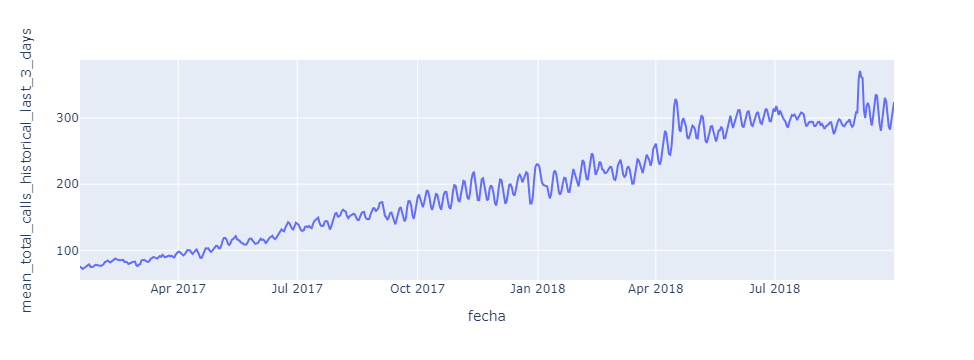

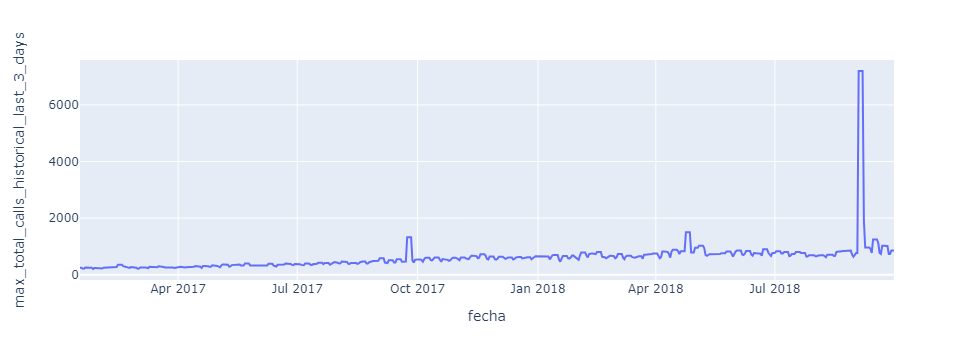

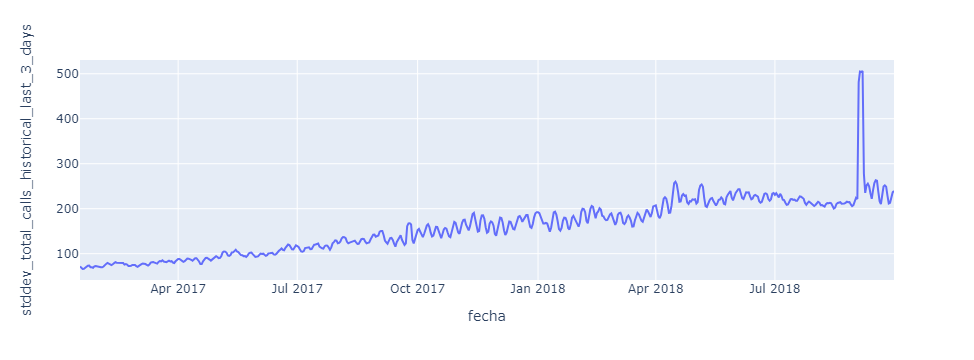

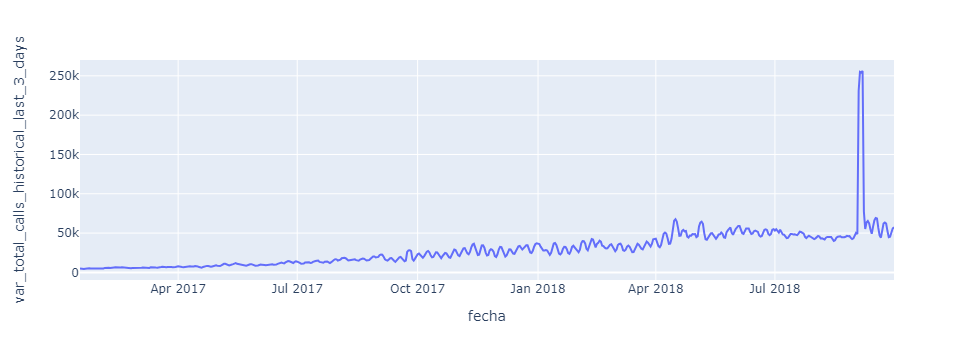

In [18]:
for column_i in columns_to_plot:
    fig = px.line(train, x='fecha', y=column_i)
    fig.show()

# Train Get Score CV

In [19]:
train_get_score_cv(
    x_train=x_train,
    y_train=y_train,
    models=models,
    k=9,
    pipeline_engine=data_pipeliene
)

Model: LGBM
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14366
[LightGBM] [Info] Number of data points in the train set: 353, number of used features: 142
[LightGBM] [Info] Start training from score 14243.087819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

,MAPE
LGBM,0.074306
LGBM_Poisson,0.078651
LGBM_Mape,0.099782
LGBM_quantile,0.084967
LGBM_parameterized,0.086271
LinearRegression,2.760298
XGBoost_poisson,0.089077
PoissonRegression,0.366578
ElasticNet,0.921872


# first Predict

In [20]:
model = LGBMRegressor(
    random_state=random_state,
)

In [21]:
model.fit(x_train.drop('fecha', axis=1), y_train)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 26394
[LightGBM] [Info] Number of data points in the train set: 623, number of used features: 167
[LightGBM] [Info] Start training from score 19691.192616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

LGBMRegressor(random_state=1601)

In [22]:
x_train.columns

Index(['fecha', 'mean_total_calls_historical_last_3_days',
       'max_total_calls_historical_last_3_days',
       'stddev_total_calls_historical_last_3_days',
       'var_total_calls_historical_last_3_days',
       'min_total_calls_historical_last_3_days',
       'mean_total_calls_duration_last_3_days',
       'max_total_calls_duration_last_3_days',
       'stddev_total_calls_duration_last_3_days',
       'var_total_calls_duration_last_3_days',
       ...
       'mean_shrinkage_rate_last_15_days', 'max_shrinkage_rate_last_15_days',
       'stddev_shrinkage_rate_last_15_days', 'var_shrinkage_rate_last_15_days',
       'min_shrinkage_rate_last_15_days', 'mean_agent_headcount_last_15_days',
       'max_agent_headcount_last_15_days',
       'stddev_agent_headcount_last_15_days',
       'var_agent_headcount_last_15_days', 'min_agent_headcount_last_15_days'],
      dtype='object', length=196)

In [23]:
test.columns

Index(['fecha', 'total_calls', 'mean_total_calls_historical_last_3_days',
       'max_total_calls_historical_last_3_days',
       'stddev_total_calls_historical_last_3_days',
       'var_total_calls_historical_last_3_days',
       'min_total_calls_historical_last_3_days',
       'mean_total_calls_duration_last_3_days',
       'max_total_calls_duration_last_3_days',
       'stddev_total_calls_duration_last_3_days',
       ...
       'mean_shrinkage_rate_last_15_days', 'max_shrinkage_rate_last_15_days',
       'stddev_shrinkage_rate_last_15_days', 'var_shrinkage_rate_last_15_days',
       'min_shrinkage_rate_last_15_days', 'mean_agent_headcount_last_15_days',
       'max_agent_headcount_last_15_days',
       'stddev_agent_headcount_last_15_days',
       'var_agent_headcount_last_15_days', 'min_agent_headcount_last_15_days'],
      dtype='object', length=197)

In [24]:
prediction = pd.DataFrame(model.predict(test.drop(['fecha','total_calls'], axis=1)), index=test['fecha'], columns=['total_calls'])  

In [25]:
prediction.to_csv('prediction_quantile.csv')

In [26]:
def prediction_plan(prediction, test, metric: mean_absolute_percentage_error, target):   
    plt.figure(figsize=(12, 6))
    plt.plot(test.index, test[target], label='Datos reales', linestyle='-')
    plt.plot(test.index, prediction, label='Predicciones', linestyle='--')
    plt.xlabel('Fecha')
    plt.ylabel('Valor de la serie de tiempo')
    plt.title('Gráfico de Serie de Tiempo y Predicciones')
    plt.legend()
    plt.show()
    score = metric(test[target], prediction)
    print(f'The score is:{score}')

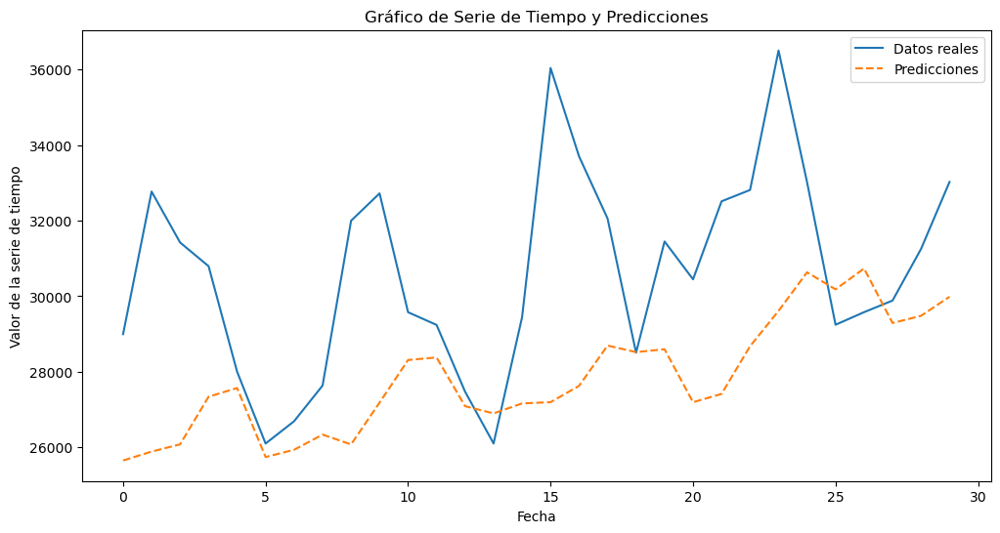

The score is:0.09243592935940953


In [27]:
prediction_plan(prediction, test, metric=mean_absolute_percentage_error, target='total_calls')

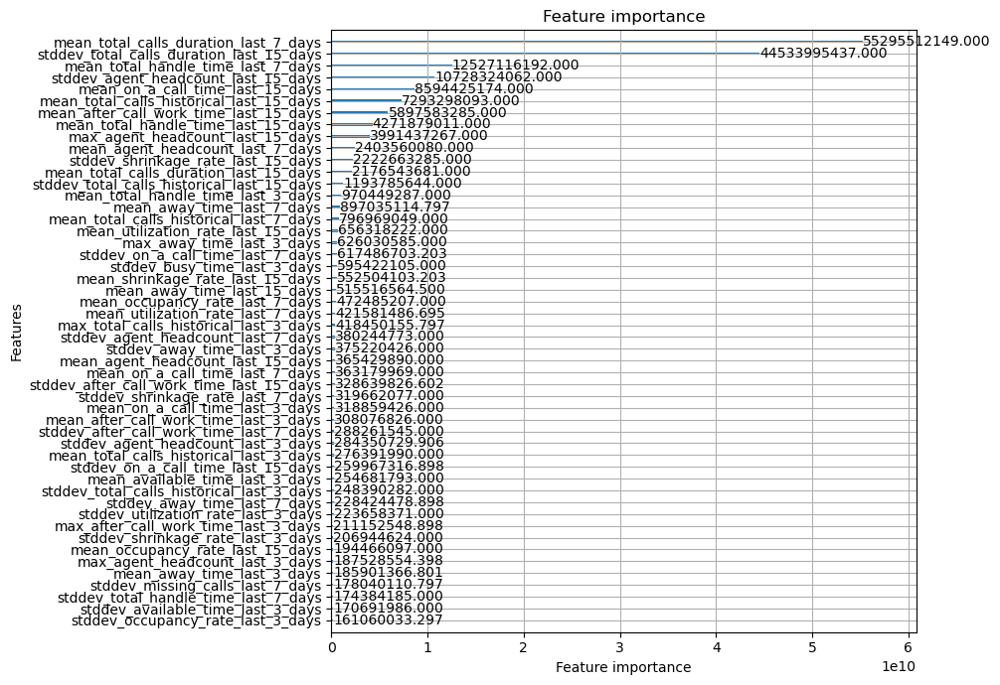

In [28]:
# Plot gain feature importance
fig, ax = plt.subplots(figsize=(10, 7))
ax = plot_importance(
    model, importance_type="gain", max_num_features=50, ax=ax,
)

plt.tight_layout()
#f_out = plots_dir / "feat_importance_gain.png"
#fig.savefig(f_out)

In [29]:
vars_selected = feature_importance_series(
    train= x_train, 
    y_train= y_train, 
    learner= LGBMRegressor(random_state=random_state), 
    pipeline= data_pipeliene
)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 26419
[LightGBM] [Info] Number of data points in the train set: 623, number of used features: 170
[LightGBM] [Info] Start training from score 19691.192616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

In [35]:
top_features = vars_selected[:70].index

In [37]:
for idx, feature in enumerate(top_features):
    print(f'{idx} {feature}')

0 dayofweek
1 stddev_away_time_last_3_days
2 stddev_shrinkage_rate_last_7_days
3 stddev_missing_calls_last_7_days
4 stddev_utilization_rate_last_3_days
5 stddev_available_time_last_3_days
6 mean_away_time_last_3_days
7 stddev_shrinkage_rate_last_15_days
8 mean_after_call_work_time_last_15_days
9 stddev_shrinkage_rate_last_3_days
10 mean_missing_calls_last_3_days
11 mean_available_time_last_7_days
12 mean_utilization_rate_last_3_days
13 mean_missing_calls_last_15_days
14 mean_available_time_last_15_days
15 stddev_occupancy_rate_last_3_days
16 mean_utilization_rate_last_15_days
17 mean_utilization_rate_last_7_days
18 mean_available_time_last_3_days
19 mean_after_call_work_time_last_3_days
20 stddev_missing_calls_last_3_days
21 stddev_on_a_call_time_last_7_days
22 stddev_after_call_work_time_last_3_days
23 max_shrinkage_rate_last_3_days
24 max_away_time_last_3_days
25 mean_away_time_last_15_days
26 mean_total_handle_time_last_7_days
27 stddev_occupancy_rate_last_7_days
28 mean_away_time_l

# With feature Importance

In [54]:
from sklearn.pipeline import Pipeline
from feature_engine.selection import DropFeatures
from feature_engine.encoding import OneHotEncoder, mean_encoding
from sklearn.preprocessing import StandardScaler
from feature_engine.wrappers import SklearnTransformerWrapper
from feature_engine.encoding import MeanEncoder

In [55]:


mean_enconding_array = ['dayofweek']

to_drop = ['fecha']
drop_features = DropFeatures(features_to_drop = to_drop)

agg_DayofWeek = AggDayofWeek(fecha_column = 'fecha')
agg_Month = AggMonth(fecha_column = 'fecha')
agg_Quarter = AggQuarter(fecha_column = 'fecha')
mean_Encoder = MeanEncoder(variables = mean_enconding_array, ignore_format = True, missing_values = 'ignore')
data_pipeliene = Pipeline(
    [ 
        ('agg_DayofWeek', agg_DayofWeek),
        ('agg_Month', agg_Month),
        ('agg_Quarter', agg_Quarter),
        ('drop_features', drop_features),
        ('mean_Encoder', mean_Encoder),
    ]
)

In [56]:
models = {
    'LGBM': LGBMRegressor(random_state=random_state),
    'LGBM_Poisson': LGBMRegressor(random_state=random_state, objective='poisson'),
    'LGBM_Mape': LGBMRegressor(random_state=random_state, objective='mape'),
    'LGBM_quantile': LGBMRegressor(random_state=random_state, objective='quantile'),
    'LGBM_parameterized': LGBMRegressor(
        objective= 'quantile',
        metric= 'mape',
        learning_rate= 0.001,
        num_iterations= 5000,
        reg_alpha= 0.244,
        reg_lambda= 0.875,
    ),
    'LinearRegression' : LinearRegression(),
    'XGBoost_poisson': xgb.XGBRegressor(
        base_score=0.5, 
        booster='gbtree',    
        n_estimators=5000,
        objective='count:poisson',
        max_depth=9,
        learning_rate=0.01,
    ),
    'PoissonRegression': linear_model.PoissonRegressor(),
    'ElasticNet': ElasticNet(
        alpha=0.244,
        l1_ratio=0.875,
        max_iter=5000,
        tol=0.0001,
        selection='cyclic',
    ),
}

In [57]:
train_get_score_cv(
    x_train=x_train,
    y_train=y_train,
    models=models,
    k=9,
    pipeline_engine=data_pipeliene,
    features_selected= top_features,
)

Model: LGBM
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14367
[LightGBM] [Info] Number of data points in the train set: 353, number of used features: 142
[LightGBM] [Info] Start training from score 14243.087819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

,MAPE
LGBM,0.074646
LGBM_Poisson,0.079604
LGBM_Mape,0.096500
LGBM_quantile,0.081860
LGBM_parameterized,0.083603
LinearRegression,1.969217
XGBoost_poisson,0.092798
PoissonRegression,0.366578
ElasticNet,0.777346


In [74]:
mean_enconding_array = ['dayofweek']

to_drop = ['fecha']
drop_features = DropFeatures(features_to_drop = to_drop)

agg_DayofWeek = AggDayofWeek(fecha_column = 'fecha')
agg_Month = AggMonth(fecha_column = 'fecha')
agg_Quarter = AggQuarter(fecha_column = 'fecha')
feature_selector = FeatureSelector(features_to_select=top_features)
mean_Encoder = MeanEncoder(variables = mean_enconding_array, ignore_format = True, missing_values = 'ignore')
data_pipeline = Pipeline(
    [ 
        ('agg_DayofWeek', agg_DayofWeek),
        ('agg_Month', agg_Month),
        ('agg_Quarter', agg_Quarter),
        ('feature_selector', feature_selector),
        #('drop_features', drop_features),
        ('mean_Encoder', mean_Encoder),
    ]
)

In [75]:
X_train_transformed = data_pipeline.fit_transform(x_train, y_train)
random_state = 1601 
model = LGBMRegressor(random_state=random_state)
model.fit(X_train_transformed, y_train)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13688
[LightGBM] [Info] Number of data points in the train set: 623, number of used features: 70
[LightGBM] [Info] Start training from score 19691.192616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

LGBMRegressor(random_state=1601)

In [77]:
test

,fecha,total_calls,mean_total_calls_historical_last_3_days,max_total_calls_historical_last_3_days,stddev_total_calls_historical_last_3_days,var_total_calls_historical_last_3_days,min_total_calls_historical_last_3_days,mean_total_calls_duration_last_3_days,max_total_calls_duration_last_3_days,stddev_total_calls_duration_last_3_days,...,var_shrinkage_rate_last_15_days,min_shrinkage_rate_last_15_days,mean_agent_headcount_last_15_days,max_agent_headcount_last_15_days,stddev_agent_headcount_last_15_days,var_agent_headcount_last_15_days,min_agent_headcount_last_15_days,dayofweek,month,quarter
0,2018-10-01,28996,324.421875,850,236.836977,56091.753672,1,54618.078125,136503,44440.273725,...,213.396476,0.0,101.772135,243,68.880817,4744.566936,2,3,11,4
1,2018-10-02,32771,316.333333,844,228.408773,52170.567450,1,54836.539062,172368,45105.703305,...,216.079385,0.0,101.797526,243,69.322266,4805.576567,2,4,11,4
2,2018-10-03,31422,301.838542,767,220.031507,48413.864203,1,53781.351562,172368,45326.110945,...,209.723570,0.0,101.509766,243,69.190093,4787.268960,2,5,11,4
3,2018-10-04,30795,288.903646,710,215.106091,46270.630378,1,51725.677083,172368,44334.824149,...,206.453720,0.0,101.591797,243,69.542802,4836.201340,1,6,11,4
4,2018-10-05,28003,297.718750,792,223.854272,50110.735313,1,49227.781250,172368,42327.703176,...,206.781799,0.0,102.158203,243,70.204627,4928.689613,1,0,11,4
5,2018-10-06,26100,297.947917,792,223.148904,49795.433312,1,45850.682292,128908,38007.379005,...,204.972311,0.0,101.938802,243,70.056535,4907.918076,1,1,11,4
6,2018-10-07,26690,292.041667,792,216.652670,46938.379460,1,41240.190104,126113,34170.986191,...,202.391197,0.0,100.505859,243,68.883104,4744.882050,1,2,11,4
7,2018-10-08,27635,285.994792,792,211.775535,44848.877257,1,36711.541667,126113,30660.232420,...,207.815128,0.0,99.579427,243,68.481864,4689.765674,1,3,11,4
8,2018-10-09,31998,270.536458,788,199.961129,39984.452975,0,34136.984375,126113,27466.320976,...,215.744067,0.0,100.027344,243,68.986147,4759.088503,1,4,11,4
9,2018-10-10,32722,260.843750,628,192.730135,37144.905026,0,33268.208333,101056,27165.691844,...,214.212092,0.0,100.315104,243,69.286026,4800.553413,1,5,11,4


In [83]:
x_test = test.drop(['total_calls'], axis=1)
X_test_transformed = data_pipeline.transform(x_test) 
prediction = pd.DataFrame(model.predict(X_test_transformed), index=test['fecha'], columns=['total_calls'])


In [84]:
prediction.to_csv('prediction_lgbm.csv')

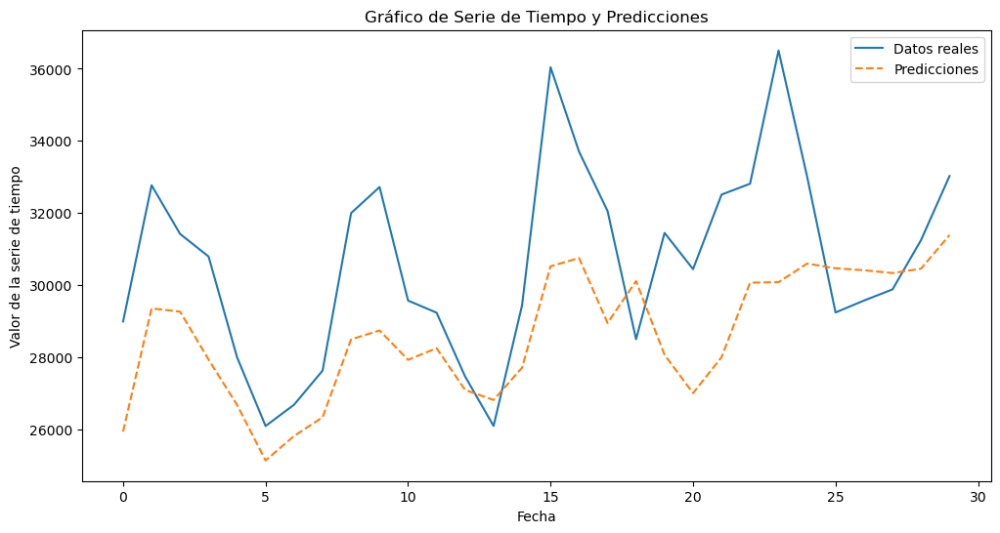

The score is:0.07331741760522932


In [85]:
prediction_plan(prediction, test, metric=mean_absolute_percentage_error, target='total_calls')

# With Standarization

In [50]:
from sklearn.pipeline import Pipeline
from feature_engine.selection import DropFeatures
from feature_engine.encoding import OneHotEncoder, mean_encoding
from sklearn.preprocessing import StandardScaler
from feature_engine.wrappers import SklearnTransformerWrapper
from feature_engine.encoding import MeanEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [51]:
mean_enconding_array = ['dayofweek']

to_drop = ['fecha']
drop_features = DropFeatures(features_to_drop = to_drop)

agg_DayofWeek = AggDayofWeek(fecha_column = 'fecha')
agg_Month = AggMonth(fecha_column = 'fecha')
agg_Quarter = AggQuarter(fecha_column = 'fecha')
feature_selector = FeatureSelector(features_to_select=top_features)
mean_Encoder = MeanEncoder(variables = mean_enconding_array, ignore_format = True, missing_values = 'ignore')

data_pipeliene = Pipeline(
    [ 
        ('agg_DayofWeek', agg_DayofWeek),
        ('agg_Month', agg_Month),
        ('agg_Quarter', agg_Quarter),
        ('feature_selector', feature_selector),
        ('drop_features', drop_features),
        ('mean_Encoder', mean_Encoder),
        ('StandardScaler', SklearnTransformerWrapper(StandardScaler()))
    ]
)

In [52]:
models = {
    'LGBM': LGBMRegressor(random_state=random_state),
    'LGBM_Poisson': LGBMRegressor(random_state=random_state, objective='poisson'),
    'LGBM_Mape': LGBMRegressor(random_state=random_state, objective='mape'),
    'LGBM_quantile': LGBMRegressor(random_state=random_state, objective='quantile'),
    'LGBM_parameterized': LGBMRegressor(
        objective= 'quantile',
        metric= 'mape',
        learning_rate= 0.001,
        num_iterations= 5000,
        reg_alpha= 0.244,
        reg_lambda= 0.875,
    ),
    'LinearRegression' : LinearRegression(),
    'XGBoost_poisson': xgb.XGBRegressor(
        base_score=0.5, 
        booster='gbtree',    
        n_estimators=5000,
        objective='count:poisson',
        max_depth=9,
        learning_rate=0.01,
    ),
    'PoissonRegression': linear_model.PoissonRegressor(),
    'ElasticNet': ElasticNet(
        alpha=0.244,
        l1_ratio=0.875,
        max_iter=5000,
        tol=0.0001,
        selection='cyclic',
    ),
}

In [53]:
train_get_score_cv(
    x_train=x_train,
    y_train=y_train,
    models=models,
    k=9,
    pipeline_engine=data_pipeliene,
    features_selected= top_features,
)

Model: LGBM
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14349
[LightGBM] [Info] Number of data points in the train set: 353, number of used features: 142
[LightGBM] [Info] Start training from score 14243.087819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

,MAPE
LGBM,7.557327e-02
LGBM_Poisson,7.802567e-02
LGBM_Mape,1.060333e-01
LGBM_quantile,8.562632e-02
LGBM_parameterized,8.555732e-02
LinearRegression,3.179474e+09
XGBoost_poisson,9.279903e-02
PoissonRegression,2.653458e-01
ElasticNet,1.741897e-01


# Prediction